In [1]:
import einops
import pandas as pd
import numpy as np
import altair as alt
from torchvision import transforms
import matplotlib.pyplot as plt
from self_supervised.vision import simclr

from ophthalmology.data.sets import DiabeticRetinopythyDetection

%matplotlib inline

In [2]:
df = pd.read_csv("../../data/diabetic-retinopathy-detection/all_labels.csv")

In [3]:
alt.data_transformers.disable_max_rows()

alt.Chart(df).mark_bar().encode(
    alt.X("level:N"),
    y='count()',
).properties(
    width=600,
    height=400,
    title="class distribution"
)

alt.Chart(...)

In [4]:
data = DiabeticRetinopythyDetection(
    image_dir="../../data/diabetic-retinopathy-detection/images",
    csv_file="../../data/diabetic-retinopathy-detection/all_labels.csv",
    transform=None
)

In [5]:
len(data)

88702

In [6]:
image, level = data[1]

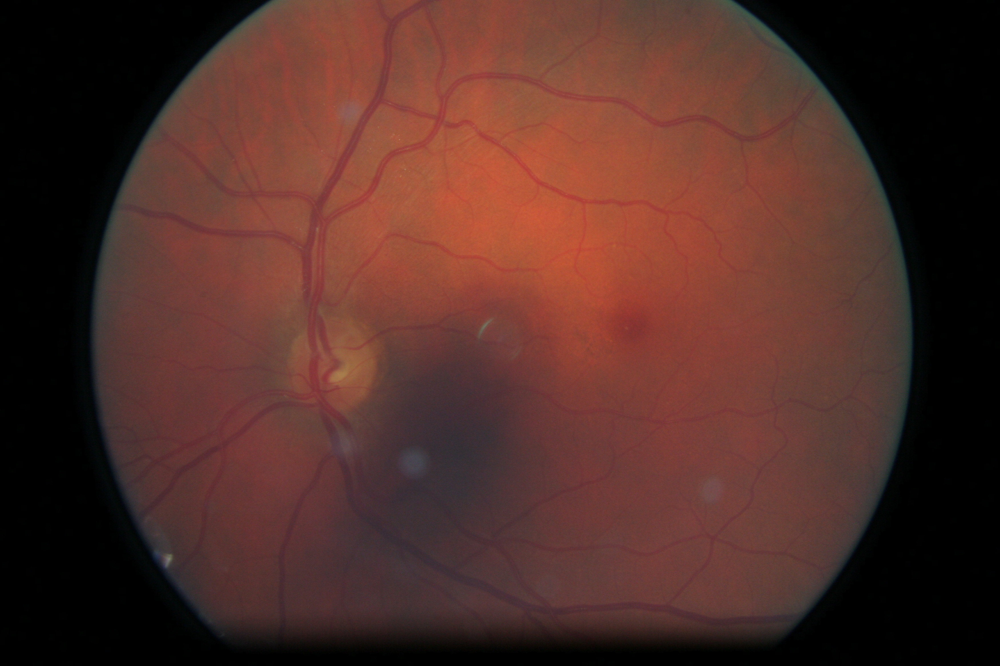

In [7]:
image

In [8]:
data = DiabeticRetinopythyDetection(
    image_dir="../../data/diabetic-retinopathy-detection/images",
    csv_file="../../data/diabetic-retinopathy-detection/all_labels.csv",
    transform=transforms.Compose([
            #transforms.Resize((28,28)),
            transforms.ToTensor(),
    ])
)

In [9]:
data[0][0].shape

torch.Size([3, 2336, 3504])

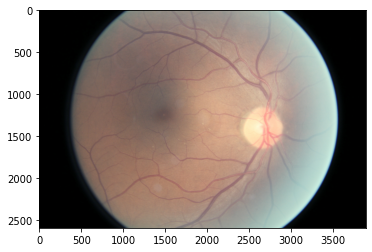

In [10]:
plt.imshow(einops.rearrange(data[46][0].squeeze(), "c w h -> w h c"))

In [11]:
aug_pipelines = transforms.Compose(simclr.get_simclr_aug_pipelines(size=128))

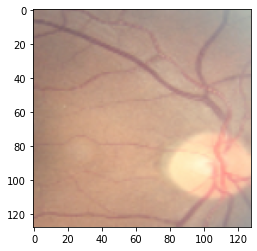

In [12]:
plt.imshow(einops.rearrange(aug_pipelines(data[46][0]).squeeze(), "c w h -> w h c"))